In [25]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")


In [26]:
def read_graph_from_txt(file_path, delimiter=',', directed=False):
    # Read the edge list from the text file into a pandas DataFrame
    df = pd.read_csv(file_path, sep=delimiter, na_values="?")

    # Create a directed or undirected graph based on the 'directed' parameter
    G = nx.DiGraph() if directed else nx.Graph()

    # Create the graph from the edge list
    G.add_edges_from(df.to_records(index=False))

    return G


In [27]:
earlyMars = read_graph_from_txt("planets/early_mars.txt",delimiter=',', directed=False)
jupiter = read_graph_from_txt("planets/jupiter.txt", delimiter=',', directed=False)
modernEarthD99 = read_graph_from_txt("planets/modern_earth_d99.txt", delimiter=',', directed=False)
modernEarthSanders = read_graph_from_txt("planets/modern_earth_sanders.txt", delimiter=',', directed=False)
mars = read_graph_from_txt("planets/modern_mars.txt",delimiter=',', directed=False)
pluto = read_graph_from_txt("planets/pluto.txt",delimiter=',', directed=False)
titan = read_graph_from_txt("planets/titan.txt",delimiter=',', directed=False)
venus = read_graph_from_txt("planets/venus.txt",delimiter=',', directed=False)

In [28]:
labels = ['Venus', 'Early Mars', 'Earth D99', 'Earth Sanders', 'Mars', 'Jupiter', 'Pluto', 'Titan']
planets = [venus, earlyMars, modernEarthD99, modernEarthSanders, mars, jupiter, pluto, titan]

In [29]:
def plot_like_paper(G, size, title, draw_final_network=False, pr=False, eg = False, color=[]):
    centrality = nx.betweenness_centrality(G) if not pr else nx.pagerank(G)
    centrality = nx.eigenvector_centrality(G) if eg else centrality
    

    node_sizes = [s * size for s in centrality.values()]

    colors = list(nx.degree_centrality(G).values()) if len(color) == 0 else color

    plt.figure(figsize=(12, 8), )
    pos = nx.kamada_kawai_layout(G)
    cmap = plt.cm.cool
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=colors, cmap=cmap, alpha=0.75, vmin=min(colors), vmax=max(colors))
    nx.draw_networkx_edges(G, pos, alpha=0.2, edge_color='gray', width=0.75)
    labels = {node: str(node) for node in G.nodes}
    nx.draw_networkx_labels(G, pos, labels=labels, font_size=6, font_family='sans-serif', alpha=0.9)
    plt.title(title)
    plt.axis('off')

    if draw_final_network:
        plt.savefig('network.png', dpi=200, transparent=True)
    else:
        plt.show()



In [30]:
# plot_like_paper(earlyMars, 10000, 'Early Mars')
# plot_like_paper(jupiter, 10000, 'Jupiter')
# plot_like_paper(modernEarthD99, 10000, 'Modern Earth D99')
# plot_like_paper(modernEarthSanders, 10000, 'Modern Earth Sanders')
# plot_like_paper(mars, 10000, 'Mars')
# plot_like_paper(pluto, 10000, 'Pluto')
# plot_like_paper(titan, 10000, 'Titan')
# plot_like_paper(venus, 10000, 'Venus')




<h1>PLANET CHEMISTRY NETWORKS Biosignature CHNOPS</h1>

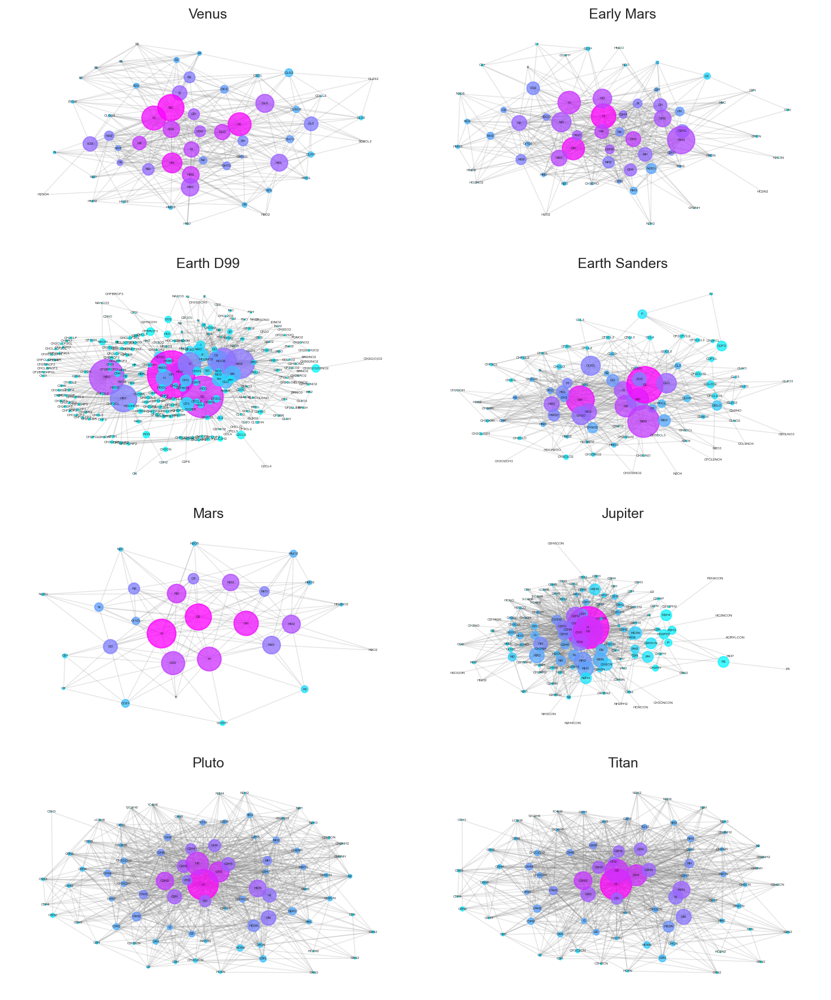

In [31]:
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10, 12), dpi=150)

axes = axes.flatten()

for i, planet in enumerate(planets):
    ax = axes[i]
    G = planet
    centrality = nx.betweenness_centrality(G)

    node_sizes = [s * 5000 for s in centrality.values()]
    pos = nx.kamada_kawai_layout(G)

    colors = list(nx.degree_centrality(G).values())
    cmap = plt.cm.cool
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=colors, cmap=cmap, alpha=0.75, vmin=min(colors), vmax=max(colors), ax=ax)
    nx.draw_networkx_edges(G, pos, alpha=0.2, edge_color='gray', width=0.75, ax=ax)
    label = {node: str(node) for node in G.nodes}
    nx.draw_networkx_labels(G, pos, labels=label, font_size=3, font_family='sans-serif', alpha=0.9, ax=ax)
    ax.set_title(labels[i])
    ax.grid(False)
    ax.set_frame_on(False)

plt.tight_layout()
plt.show()

In [32]:
def extractChemistry(G, chem = [] ,directed = False):
    nG = nx.DiGraph() if directed else nx.Graph()
    edges = list([(n, e) for n, e in G.edges if any(letter in str(n) for letter in chem)])
    nG.add_edges_from(edges)
    return nG




In [33]:
def getCHNOPS(G, chnops=False ,directed = False):
    nG = nx.DiGraph() if directed else nx.Graph()
    edges = list((n, e) for n,e in G.edges if n  == 'C' or n  == 'H' or n == 'N' or n  == 'O' or n  == 'P' or n == 'S' )
    edges = list((n, e) for n,e in G.edges if n  == 'C' or n  == 'H' or n == 'N' or n  == 'O' or n == 'S' ) if not chnops else edges
    nG.add_edges_from(edges)
    return nG


In [34]:
len(extractChemistry(modernEarthD99, ['C', 'H', 'N', 'O', 'P', 'S']).edges())

695

In [35]:
len(getCHNOPS(mars, chnops=True).edges())

38

In [36]:
len(extractChemistry(mars, ['C', 'H', 'N', 'O', 'P', 'S']))

28

In [37]:
def plots_coef():
    labels = ['Venus', 'Early Mars', 'Earth D99', 'Earth Sanders', 'Mars', 'Jupiter', 'Pluto', 'Titan']
    planets = [venus, earlyMars, modernEarthD99, modernEarthSanders, mars, jupiter, pluto, titan]

    scores = {
        'Assortativity Coefficient': [nx.degree_assortativity_coefficient(planet) for planet in planets],
        'Clustering Coefficient': [nx.average_clustering(planet) for planet in planets],
        'Transitivity': [nx.transitivity(planet) for planet in planets],
        'Shortest Path': [nx.average_shortest_path_length(planet) for planet in planets]
    }

    sns.set(style="whitegrid")
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))

    for i, (score_name, score_values) in enumerate(scores.items()):
        row, col = divmod(i, 2)
        ax = axes[row, col]
        sns.barplot(x=labels, y=score_values, palette="tab10", ax=ax)
        ax.set_title(score_name)
        ax.set_xticklabels(labels, rotation=45, fontsize=8)

    plt.tight_layout()
    plt.show()

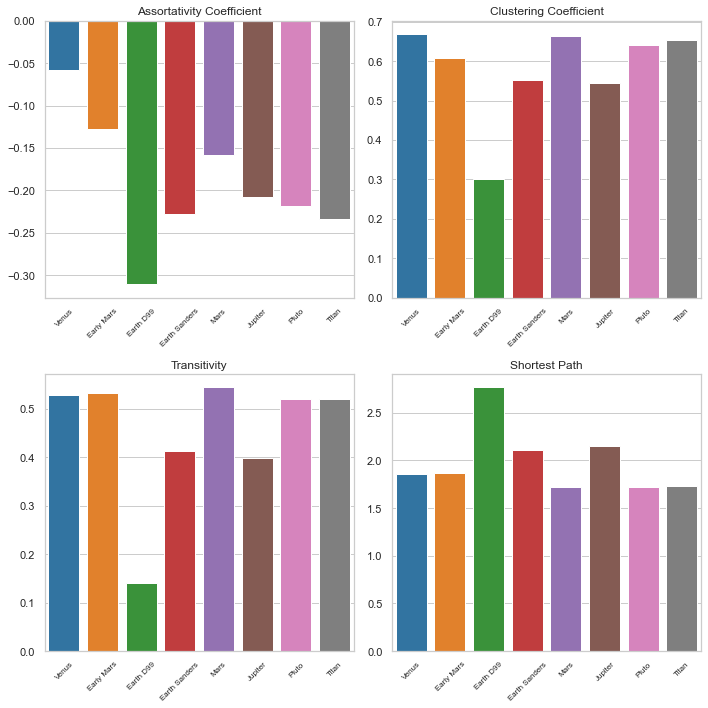

In [38]:
plots_coef()

In [39]:
from scipy.stats import norm, lognorm, powerlaw, expon, poisson
import collections

def plot_dist(G, subplot, title):

    plt.subplot(subplot)

    degree_sequence = sorted([d for n, d in G.degree()], reverse=True)  # degree sequence
    degreeCount = collections.Counter(degree_sequence)
    deg, cnt = zip(*degreeCount.items())
    cs = np.cumsum(cnt)

    plt.loglog(deg, cs, 'bo', color='black')

    # Lognormal Distribution
    params_lognorm = lognorm.fit(cs)
    pdf_lognorm = lognorm.cdf(cs, *params_lognorm)
    plt.loglog(deg, pdf_lognorm* cs[-1], label='Lognormal Fit', linestyle='-', color='orange')

    # Poisson Distribution
    mu = np.mean(cnt)
    pdf_poisson = poisson.cdf(cs, mu)
    plt.loglog(deg, pdf_poisson* cs[-1], label='Poisson Fit"', linestyle='-', color='purple')

    # Normal Distribution
    params_norm = norm.fit(cs)
    pdf_norm = norm.cdf(cs, *params_norm)
    plt.loglog(deg, pdf_norm* cs[-1], label='Normal Fit', linestyle='-', color='blue')

    # Power-law
    params_powerlaw = powerlaw.fit(cs)
    pdf_powerlaw = powerlaw.cdf(cs, *params_powerlaw)
    plt.loglog(deg, pdf_powerlaw * cs[-1]+1, label='Power-law Fit', linestyle='-', color='red')

    
    # Exponential Distribution
    params_exponential = expon.fit(cs)
    pdf_exponential = expon.cdf(cs, *params_exponential)
    plt.loglog(deg, pdf_exponential * cs[-1]+1, label='Exponential Fit', linestyle='-', color='green')
    plt.grid(False)
    plt.title(title)


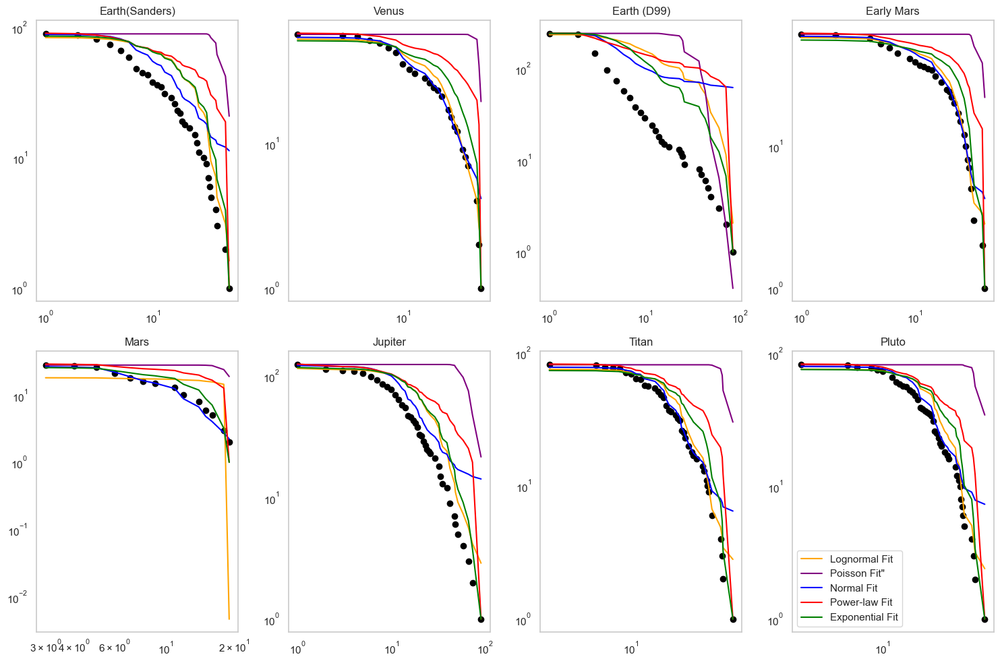

In [40]:

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(15, 10), dpi=100)

plot_dist(modernEarthSanders, 241, "Earth(Sanders)")
plot_dist(venus, 242, "Venus")
plot_dist(modernEarthD99, 243, "Earth (D99)")
plot_dist(earlyMars, 244, "Early Mars")
plot_dist(mars, 245, "Mars")
plot_dist(jupiter, 246, "Jupiter")
plot_dist(titan, 247, "Titan")
plot_dist(pluto, 248, "Pluto")

plt.legend()
plt.tight_layout()
plt.show()


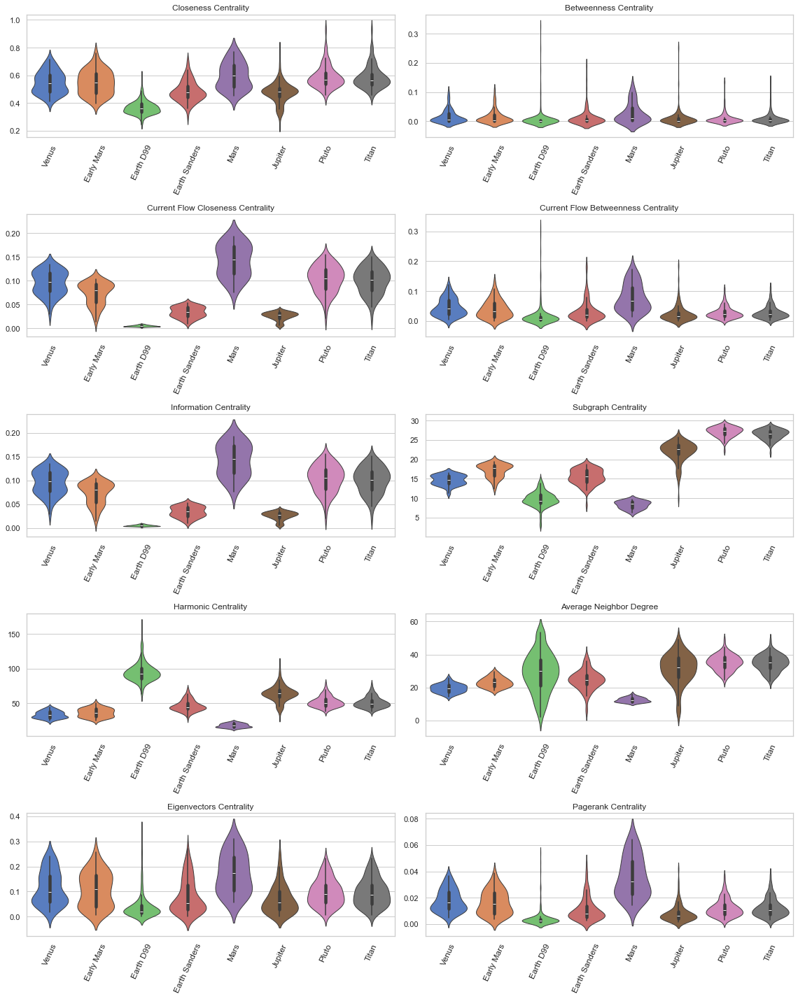

In [41]:
import itertools
def plot_centralities(planets, chnops=False):
    closeness_centrality = {}
    betweenness_centrality_dict = {}
    information_cen = {}
    subgraph = {}
    harmonic = {}
    avg_cent = {}
    eigen_cent={}
    pagerank={}
    current_flow_betweenness_centrality={}
    current_flow_closeness_centrality={}

    centrality_measures = [
        (closeness_centrality, nx.closeness_centrality),
        (betweenness_centrality_dict, nx.betweenness_centrality),
        (information_cen, nx.information_centrality),
        (subgraph, lambda G: {node: np.log(centrality) for node, centrality in nx.subgraph_centrality(G).items()}),
        (harmonic, nx.harmonic_centrality),
        (avg_cent, nx.average_neighbor_degree),
        (eigen_cent, nx.eigenvector_centrality),
        (pagerank, nx.pagerank,),
        (current_flow_betweenness_centrality, nx.current_flow_betweenness_centrality),
        (current_flow_closeness_centrality, nx.current_flow_closeness_centrality)
    ]

    for i, label in enumerate(labels):
        for centrality_dict, centrality_function in centrality_measures:
            centrality_dict[label] = centrality_function(planets[i] if not chnops else getCHNOPS(planets[i], chnops=True) )

    dataframes = {
        'Closeness Centrality': pd.DataFrame(closeness_centrality),
        'Betweenness Centrality': pd.DataFrame(betweenness_centrality_dict),
        'Current Flow Closeness Centrality': pd.DataFrame(current_flow_closeness_centrality),
        'Current Flow Betweenness Centrality': pd.DataFrame(current_flow_betweenness_centrality),
        'Information Centrality': pd.DataFrame(information_cen),
        'Subgraph Centrality': pd.DataFrame(subgraph),
        'Harmonic Centrality': pd.DataFrame(harmonic),
        'Average Neighbor Degree': pd.DataFrame(avg_cent),
        'Eigenvectors Centrality': pd.DataFrame(eigen_cent),
        'Pagerank Centrality': pd.DataFrame(pagerank),
        
        
    }

    # Plotting
    fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(16, 20))

    for (title, df), (row, col) in zip(dataframes.items(), itertools.product(range(5), range(2))):
        sns.violinplot(data=df, ax=axes[row, col],  palette="muted", linewidth=1,)
        axes[row, col].set_title(title)
        axes[row, col].tick_params(axis='x', labelrotation=65, labelsize=12)


    plt.tight_layout()
    plt.show()
plot_centralities(planets)

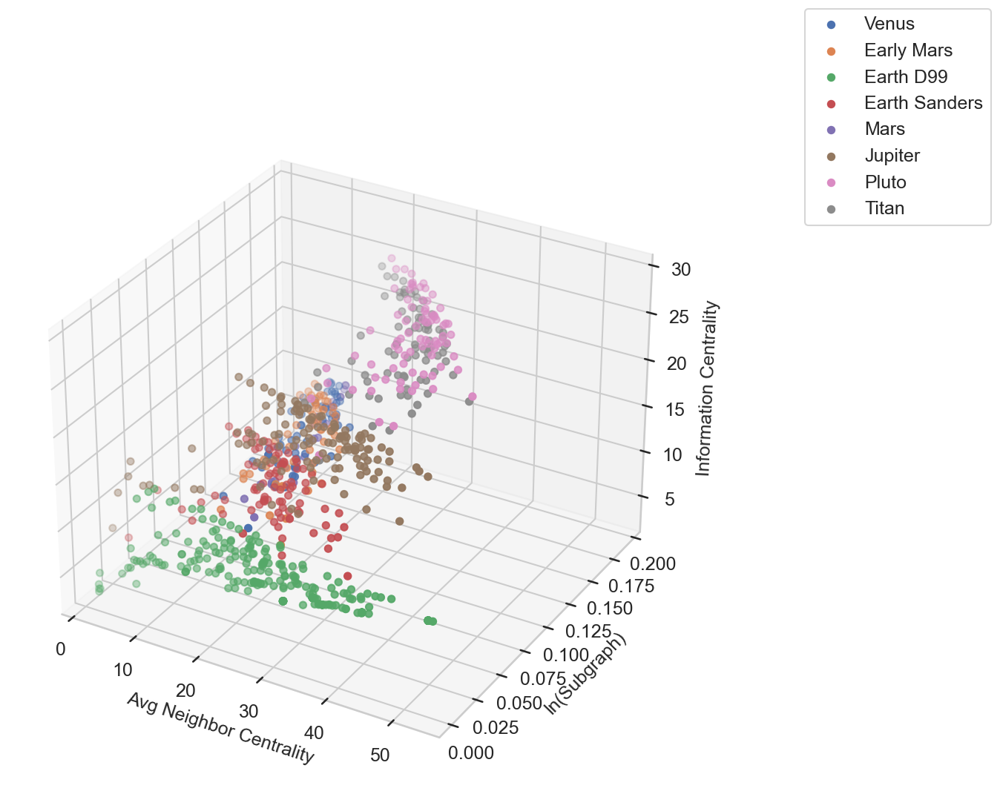

In [42]:
fig = plt.figure(figsize=(12,8), dpi=150)
ax = fig.add_subplot(projection='3d')
for i, label in enumerate(labels):
    xs= list(nx.average_neighbor_degree(planets[i]).values())
    ys= list(nx.information_centrality(planets[i]).values())
    zs= list(np.log(v) for v in nx.subgraph_centrality(planets[i]).values())
    ax.scatter(xs, ys, zs, label=label)


ax.tick_params(axis='x', labelsize=12) 
ax.tick_params(axis='y', labelsize=12)  
ax.tick_params(axis='z', labelsize=12) 
ax.set_xlabel('Avg Neighbor Centrality')
ax.set_zlabel('Information Centrality')
ax.set_ylabel('ln(Subgraph)')
fig.legend(fontsize=12)

In [43]:
import plotly.graph_objects as go
fig = go.Figure()

for i, label in enumerate(labels):
    xs = list(nx.average_neighbor_degree(planets[i]).values())
    ys = list(nx.information_centrality(planets[i]).values())
    zs = list(np.log(v) for v in nx.subgraph_centrality(planets[i]).values())
    point_labels = [f"{label}: {x}, {y}, {z}" for x, y, z in zip(xs, ys, zs)]
    scatter = go.Scatter3d(
        x=xs,
        y=ys,
        z=zs,
        mode='markers',
        marker=dict(size=4),  # Adjust the marker size as needed
        name=label
    )


    fig.add_trace(scatter)

# Update layout
fig.update_layout(
    scene=dict(
        xaxis=dict(title='Avg Neighbor Centrality', tickfont=dict(size=12)),
        yaxis=dict(title='Information Centrality', tickfont=dict(size=12)),
        zaxis=dict(title='ln(Subgraph)', tickfont=dict(size=12)),
    ),
    legend=dict(font=dict(size=18)),width=800,  
    height=400 
)

fig.show()


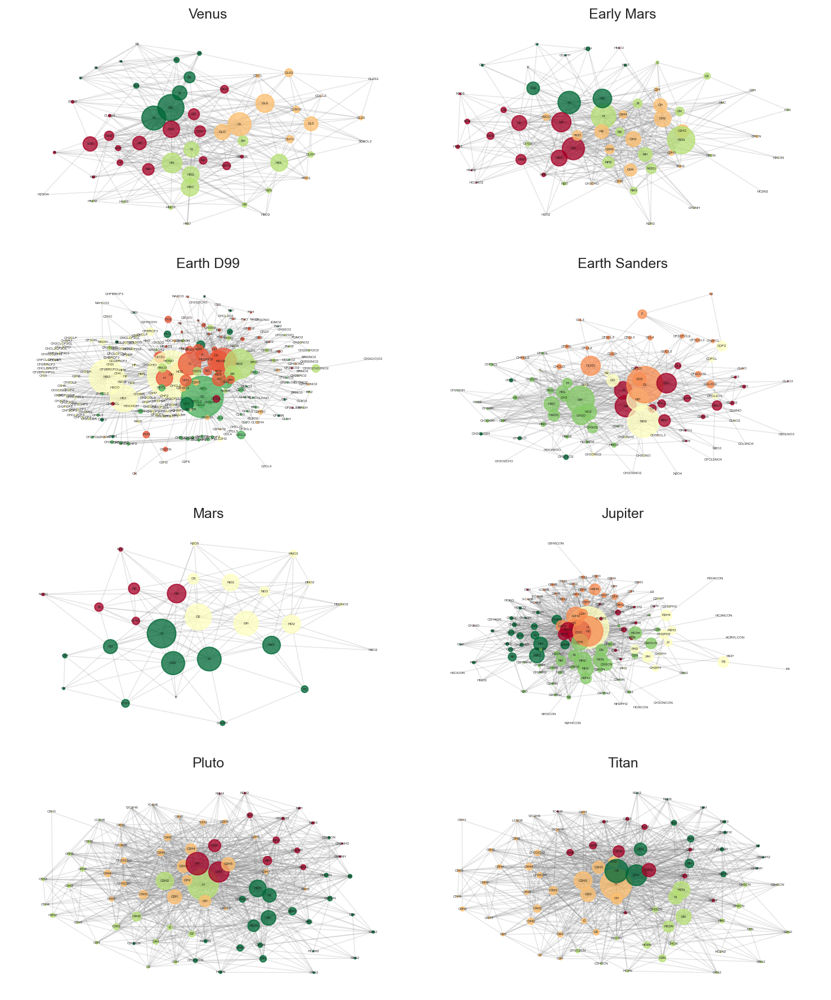

In [44]:

# def plot_communities(G, title):
#     centrality = nx.betweenness_centrality(G)

#     node_sizes = [s * 20000 for s in centrality.values()]
#     # Used force-directed layout (spring layout) for visualization
#     pos = nx.spring_layout(G)
#     communities = list(nx.community.louvain_communities(G))

#     community_dict = {node: idx for idx, comm in enumerate(communities) for node in comm}

#     colors = [community_dict[node] for node in G.nodes]
#     plt.figure(figsize=(12, 8), dpi=100)
#     cmap = plt.cm.RdYlGn
#     nodes = nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=colors, cmap=cmap, alpha=0.75, vmin=min(colors), vmax=max(colors))
#     nx.draw_networkx_edges(G, pos, alpha=0.2, edge_color='gray', width=0.75)
#     labels = {node: str(node) for node in G.nodes}
#     nx.draw_networkx_labels(G, pos, labels=labels, font_size=6, font_family='sans-serif', alpha=0.9)
#     plt.axis('off')
#     plt.title(title)
#     plt.show()


fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10, 12), dpi=150)

axes = axes.flatten()

for i, planet in enumerate(planets):
    ax = axes[i]
    G = planet
    centrality = nx.betweenness_centrality(G)

    node_sizes = [s * 5000 for s in centrality.values()]
    pos = nx.kamada_kawai_layout(G)

    communities = list(nx.community.louvain_communities(G))

    community_dict = {node: idx for idx, comm in enumerate(communities) for node in comm}

    colors = [community_dict[node] for node in G.nodes]
    cmap = plt.cm.RdYlGn
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=colors, cmap=cmap, alpha=0.75, vmin=min(colors), vmax=max(colors), ax=ax)
    nx.draw_networkx_edges(G, pos, alpha=0.2, edge_color='gray', width=0.75, ax=ax)
    label = {node: str(node) for node in G.nodes}
    nx.draw_networkx_labels(G, pos, labels=label, font_size=3, font_family='sans-serif', alpha=0.9, ax=ax)
    ax.set_title(labels[i])
    ax.grid(False)
    ax.set_frame_on(False)

plt.tight_layout()
plt.show()

In [45]:
# for i, planet in enumerate(planets):
#     plot_communities(planet, labels[i])

<h1>K-means and DBScan</h1>

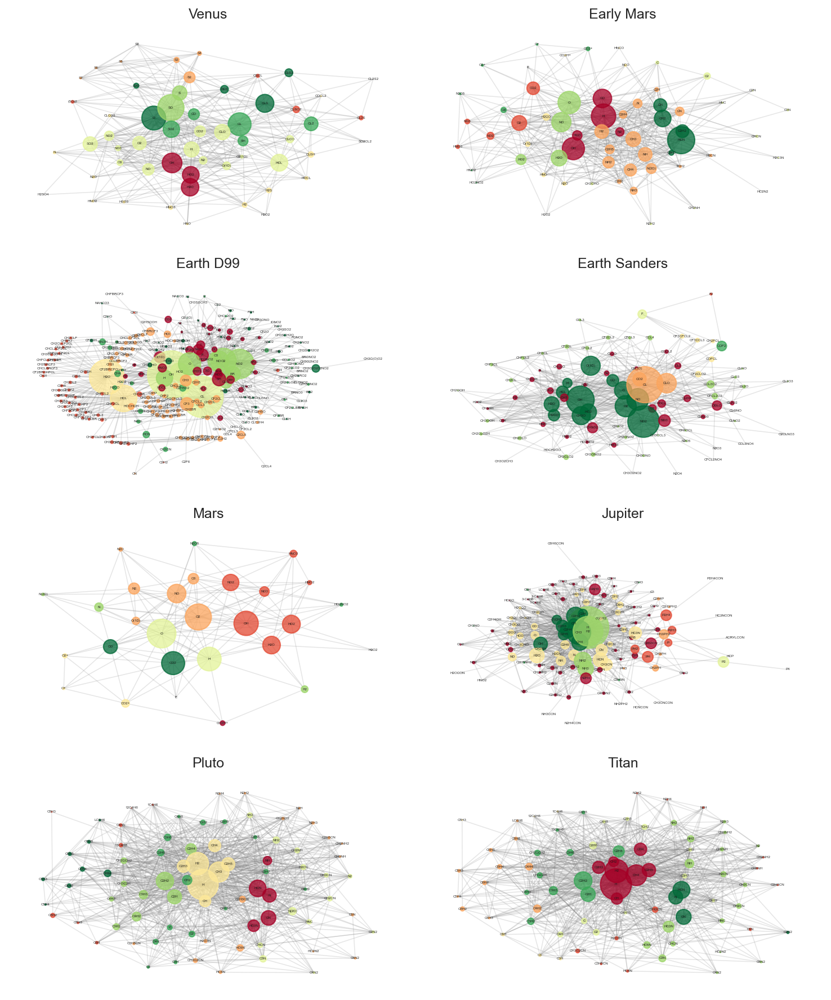

In [46]:
from sklearn.cluster import KMeans,DBSCAN
# G = modernEarthSanders

# node_sizes = [s * 30000 for s in nx.betweenness_centrality(G).values()]
# # Used force-directed layout (spring layout) for visualization
# pos = nx.spring_layout(G)
# nl = nx.normalized_laplacian_matrix(G).toarray()
# eigenvalues, eigenvectors =np.linalg.eig(nl)
# # node_sizes = [s * 500 for s in eigenvalues]

# # kmeans = KMeans()
# clusters = kmeans.fit_predict(eigenvectors[:, 0:2])
# c_lables = kmeans.labels_

# # c_lables = DBSCAN(eps=2,min_samples=10).fit_predict(nx.adjacency_matrix(G))
# # c_lables = dbscan.labels_

# community_dict = dict(zip(G.nodes, c_lables))
# # colors = [community_dict[node] for node in G.nodes]
# plt.figure(figsize=(12, 8), dpi=300)
# cmap = plt.cm.RdYlGn
# nodes = nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=c_lables, cmap=cmap, alpha=0.75, vmin=min(c_lables), vmax=max(c_lables))
# nx.draw_networkx_edges(G, pos, alpha=0.2, edge_color='gray', width=0.75)
# nx.draw_networkx_labels(G, pos,  font_size=6, font_family='sans-serif', alpha=0.9)
# plt.axis('off')
# plt.title('DBSCAN - Earth Sanders')
# plt.show()


fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10, 12), dpi=150)

axes = axes.flatten()

for i, planet in enumerate(planets):
    ax = axes[i]
    G = planet
    centrality = nx.betweenness_centrality(G)

    node_sizes = [s * 5000 for s in centrality.values()]
    pos = nx.kamada_kawai_layout(G)

    # colors = list(nx.degree_centrality(G).values())
    nl = nx.normalized_laplacian_matrix(G).toarray()
    eigenvalues, eigenvectors =np.linalg.eig(nl)
    # node_sizes = [s * 500 for s in eigenvalues]

    kmeans = KMeans()
    clusters = kmeans.fit_predict(eigenvectors[:, 0:2])
    c_lables = kmeans.labels_

    cmap = plt.cm.RdYlGn
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=c_lables, cmap=cmap, alpha=0.75, vmin=min(c_lables), vmax=max(c_lables), ax=ax)
    nx.draw_networkx_edges(G, pos, alpha=0.2, edge_color='gray', width=0.75, ax=ax)
    label = {node: str(node) for node in G.nodes}
    nx.draw_networkx_labels(G, pos, labels=label, font_size=3, font_family='sans-serif', alpha=0.9, ax=ax)
    ax.set_title(labels[i])
    ax.grid(False)
    ax.set_frame_on(False)

plt.tight_layout()
plt.show()

[t-SNE] Computing 88 nearest neighbors...
[t-SNE] Indexed 89 samples in 0.000s...
[t-SNE] Computed neighbors for 89 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 89 / 89
[t-SNE] Mean sigma: 0.045767
[t-SNE] KL divergence after 250 iterations with early exaggeration: 53.193680
[t-SNE] KL divergence after 1000 iterations: 0.252801


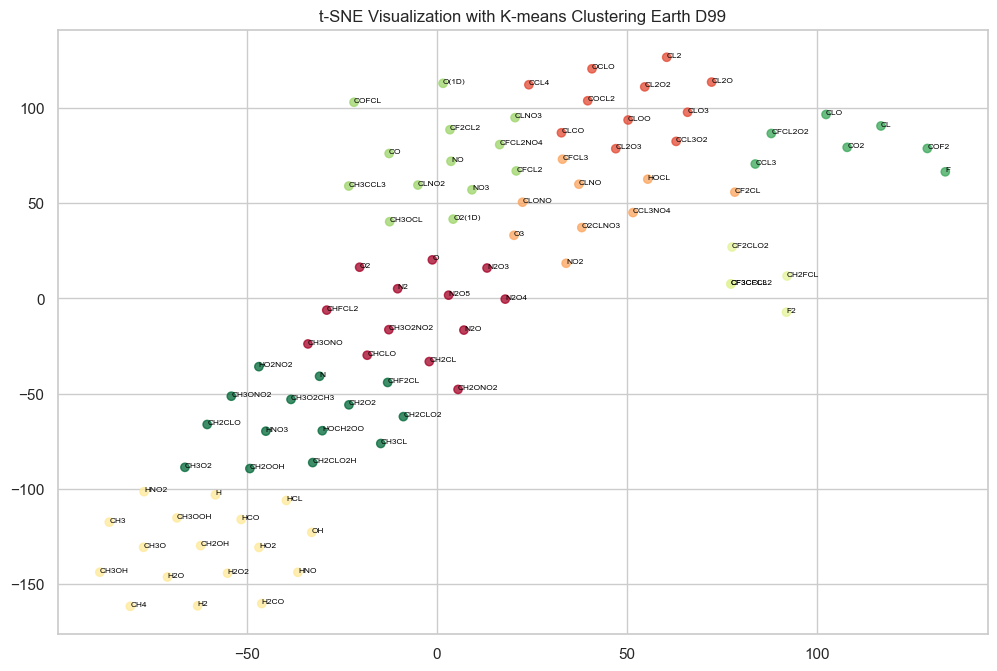

In [47]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans, DBSCAN

G = modernEarthSanders
nl = nx.normalized_laplacian_matrix(G).toarray()
eigenvalues, eigenvectors = np.linalg.eig(nl)
tsne = TSNE( n_components=2, perplexity = 30.0, early_exaggeration = 12, 
               n_iter = 1000, learning_rate = 368, verbose = 1)
embedding = tsne.fit_transform(eigenvectors[:, 1:3])

kmeans = KMeans()
clusters = kmeans.fit_predict(embedding)
c_labels = kmeans.labels_

# c_labels = DBSCAN(eps = 2, min_samples = 10).fit_predict(embedding)

pos = nx.spring_layout(G)
plt.figure(figsize=(12, 8), dpi=100)
cmap = plt.cm.RdYlGn
scatter = plt.scatter(embedding[:, 0], embedding[:, 1], c=c_labels, cmap=cmap,alpha=0.75)
for i, label in enumerate(G.nodes()):
    plt.text(embedding[i, 0], embedding[i, 1], str(label), fontsize=6, color='black')


plt.title('t-SNE Visualization with K-means Clustering Earth D99')
plt.show()


<H1>Tried to extract CHNOPS</h1>

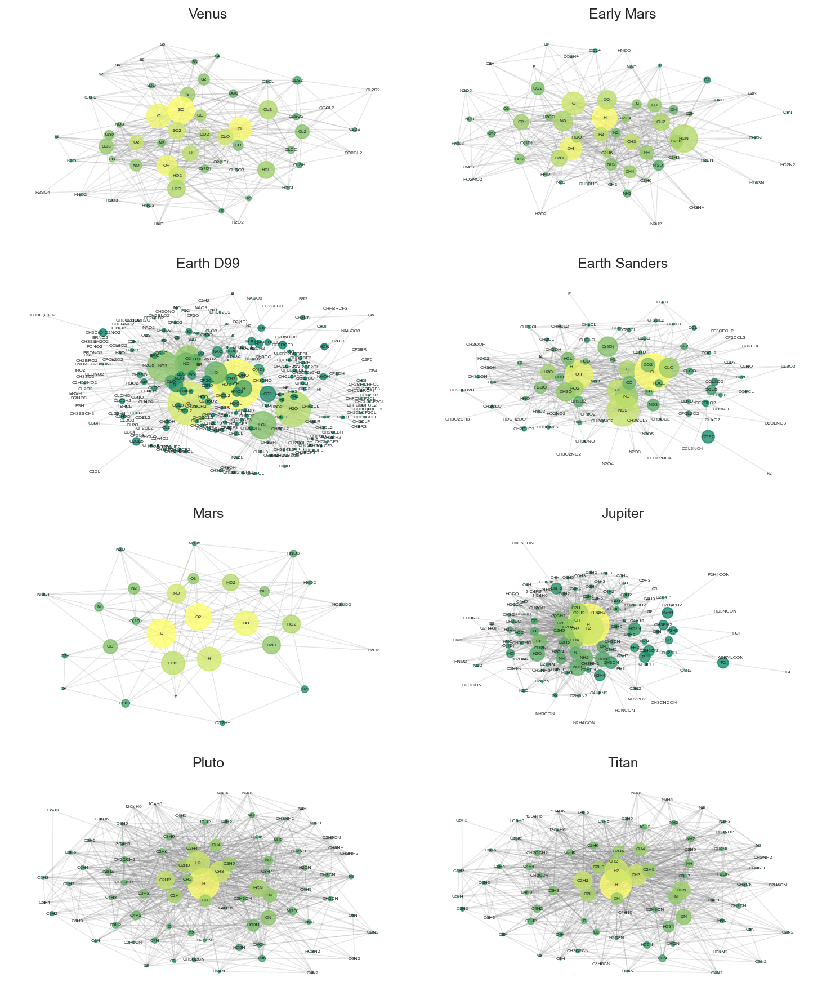

In [48]:

fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10, 12), dpi=150)
axes = axes.flatten()

for i, planet in enumerate(planets):
    ax = axes[i]
    G = extractChemistry(planet, ['C', 'H', 'N', 'O', 'P', 'S'])
    centrality = nx.betweenness_centrality(G)
    
    node_sizes = [s * 5000 for s in centrality.values()]
    pos = nx.kamada_kawai_layout(G)
    colors = list(nx.degree_centrality(G).values())
    cmap = plt.cm.summer
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=colors, cmap=cmap, alpha=0.75, vmin=min(colors), vmax=max(colors), ax=ax)
    nx.draw_networkx_edges(G, pos, alpha=0.2, edge_color='gray', width=0.75, ax=ax)
    label = {node: str(node) for node in G.nodes}
    nx.draw_networkx_labels(G, pos, labels=label, font_size=4, font_family='sans-serif', alpha=0.9, ax=ax)
    ax.set_title(labels[i])
    ax.grid(False)
    ax.set_frame_on(False)

plt.tight_layout()
plt.show()

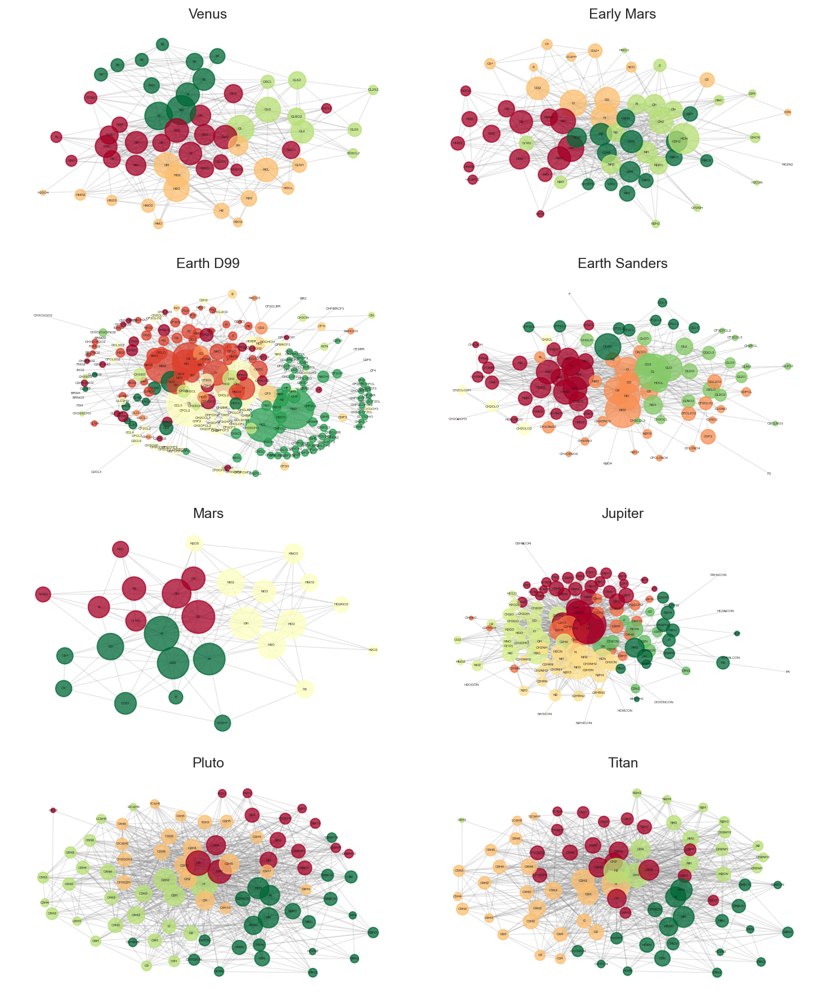

In [49]:

fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10, 12), dpi=150)

axes = axes.flatten()

for i, planet in enumerate(planets):
    ax = axes[i]
    G = extractChemistry(planet, ['C', 'H', 'N', 'O', 'P', 'S'])
    centrality = nx.current_flow_betweenness_centrality(G)

    node_sizes = [s * 5000 for s in centrality.values()]
    pos = nx.kamada_kawai_layout(G)
    nl = nx.normalized_laplacian_matrix(G).toarray()
    eigenvalues, eigenvectors =np.linalg.eig(nl)
    # node_sizes = [s * 500 for s in eigenvalues]

    # kmeans = KMeans()
    # clusters = kmeans.fit_predict(nl)
    # c_lables = kmeans.labels_

    communities = list(nx.community.louvain_communities(G))

    community_dict = {node: idx for idx, comm in enumerate(communities) for node in comm}

    colors = [community_dict[node] for node in G.nodes]
    cmap = plt.cm.RdYlGn
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=colors, cmap=cmap, alpha=0.75, vmin=min(colors), vmax=max(colors), ax=ax)
    nx.draw_networkx_edges(G, pos, alpha=0.2, edge_color='gray', width=0.75, ax=ax)
    label = {node: str(node) for node in G.nodes}
    nx.draw_networkx_labels(G, pos, labels=label, font_size=3, font_family='sans-serif', alpha=0.9, ax=ax)
    ax.set_title(labels[i])
    ax.grid(False)
    ax.set_frame_on(False)


plt.tight_layout()


plt.show()

In [50]:
getCHNOPS(mars, chnops=True).edges()

EdgeView([('O', 'O2'), ('O', 'O3'), ('O', 'H'), ('O', 'OH'), ('O', 'HO2'), ('O', 'H2O'), ('O', 'N'), ('O', 'N(2D)'), ('O', 'N2'), ('O', 'NO'), ('O', 'NO2'), ('O', 'NO3'), ('O', 'N2O5'), ('O', 'CO'), ('O', 'CO2'), ('O', 'O+'), ('O', 'O2+'), ('O', 'CO2+'), ('O', 'E'), ('H', 'O(1D)'), ('H', 'H2'), ('H', 'OH'), ('H', 'HO2'), ('H', 'H2O'), ('H', 'N'), ('H', 'N2'), ('H', 'NO'), ('H', 'NO2'), ('H', 'CO'), ('H', 'CO2'), ('H', 'CO2+'), ('H', 'CO2H+'), ('H', 'E'), ('N', 'N(2D)'), ('N', 'N2'), ('N', 'NO'), ('N', 'N2O'), ('N', 'CO')])

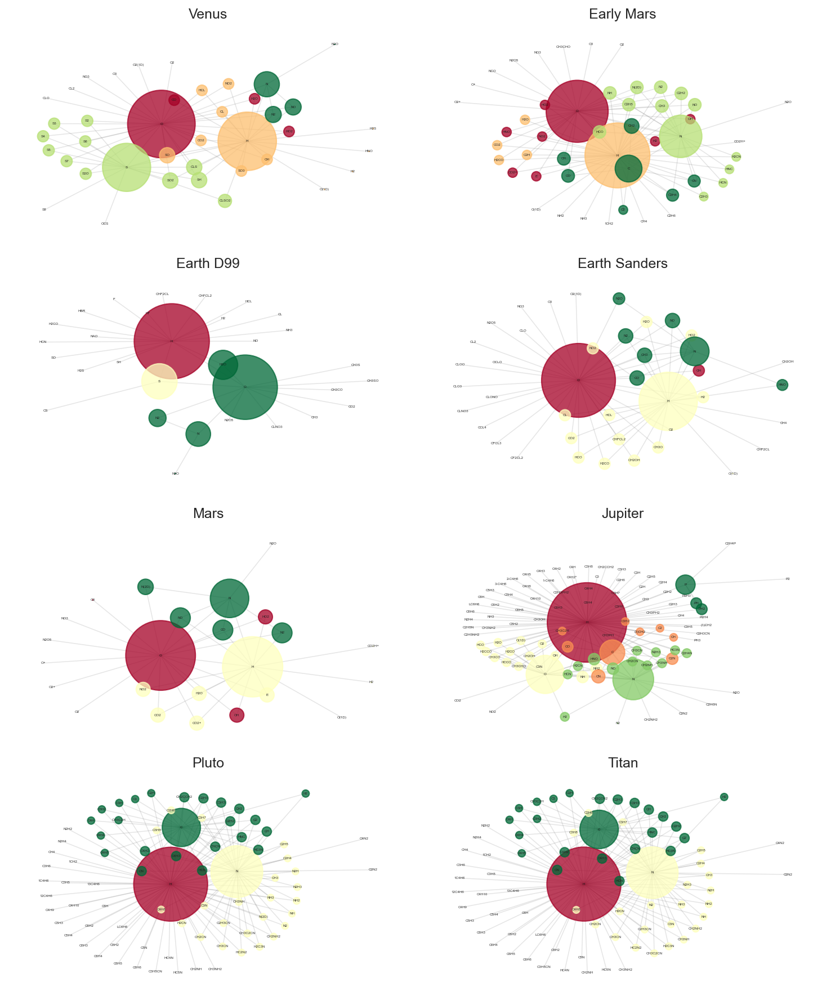

In [51]:

fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10, 12), dpi=150)

axes = axes.flatten()

for i, planet in enumerate(planets):
    ax = axes[i]
    G = getCHNOPS(planet, chnops=True)
    centrality = nx.current_flow_betweenness_centrality(G)

    node_sizes = [s * 5000 for s in centrality.values()]
    pos = nx.kamada_kawai_layout(G)
    nl = nx.normalized_laplacian_matrix(G).toarray()
    eigenvalues, eigenvectors =np.linalg.eig(nl)
    # node_sizes = [s * 500 for s in eigenvalues]

    # kmeans = KMeans()
    # clusters = kmeans.fit_predict(nl)
    # c_lables = kmeans.labels_

    communities = list(nx.community.louvain_communities(G))

    community_dict = {node: idx for idx, comm in enumerate(communities) for node in comm}

    colors = [community_dict[node] for node in G.nodes]
    cmap = plt.cm.RdYlGn
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=colors, cmap=cmap, alpha=0.75, vmin=min(colors), vmax=max(colors), ax=ax)
    nx.draw_networkx_edges(G, pos, alpha=0.2, edge_color='gray', width=0.75, ax=ax)
    label = {node: str(node) for node in G.nodes}
    nx.draw_networkx_labels(G, pos, labels=label, font_size=3, font_family='sans-serif', alpha=0.9, ax=ax)
    ax.set_title(labels[i])
    ax.grid(False)
    ax.set_frame_on(False)


plt.tight_layout()


plt.show()

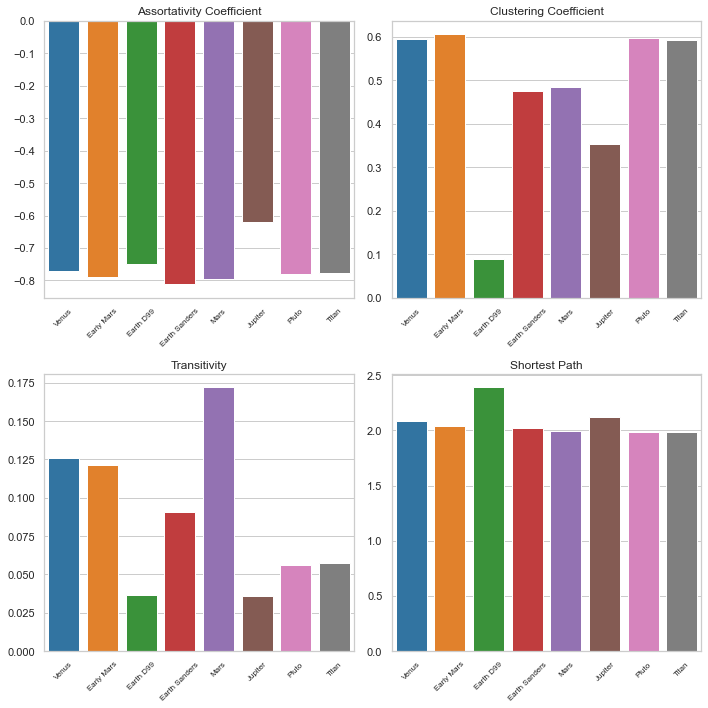

In [52]:
def plots_coef():
    labels = ['Venus', 'Early Mars', 'Earth D99', 'Earth Sanders', 'Mars', 'Jupiter', 'Pluto', 'Titan']
    planets_list = [venus, earlyMars, modernEarthD99, modernEarthSanders, mars, jupiter, pluto, titan]
    planets=[]
    for planet in planets_list:
        planets.append(getCHNOPS(planet, chnops=True))

    scores = {
        'Assortativity Coefficient': [nx.degree_assortativity_coefficient(planet) for planet in planets],
        'Clustering Coefficient': [nx.average_clustering(planet) for planet in planets],
        'Transitivity': [nx.transitivity(planet) for planet in planets],
        'Shortest Path': [nx.average_shortest_path_length(planet) for planet in planets]
    }

    sns.set(style="whitegrid")
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))

    for i, (score_name, score_values) in enumerate(scores.items()):
        row, col = divmod(i, 2)
        ax = axes[row, col]
        sns.barplot(x=labels, y=score_values, palette="tab10", ax=ax)
        ax.set_title(score_name)
        ax.set_xticklabels(labels, rotation=45, fontsize=8)

    plt.tight_layout()
    plt.show()
plots_coef()

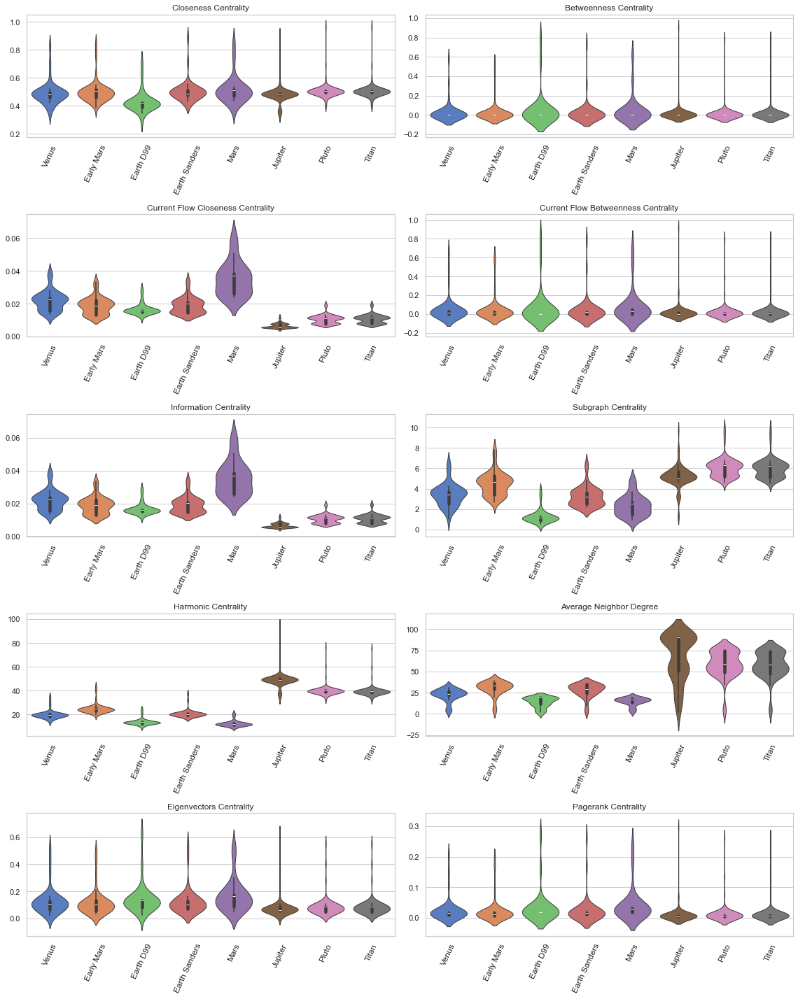

In [53]:
plot_centralities(planets, chnops= True)

Computing transition probabilities:   0%|          | 0/243 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:09<00:00, 32.83it/s]


[t-SNE] Computing 148 nearest neighbors...
[t-SNE] Indexed 243 samples in 0.001s...
[t-SNE] Computed neighbors for 243 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 243 / 243
[t-SNE] Mean sigma: 0.995793
[t-SNE] KL divergence after 50 iterations with early exaggeration: 47.127754
[t-SNE] KL divergence after 950 iterations: 0.455139


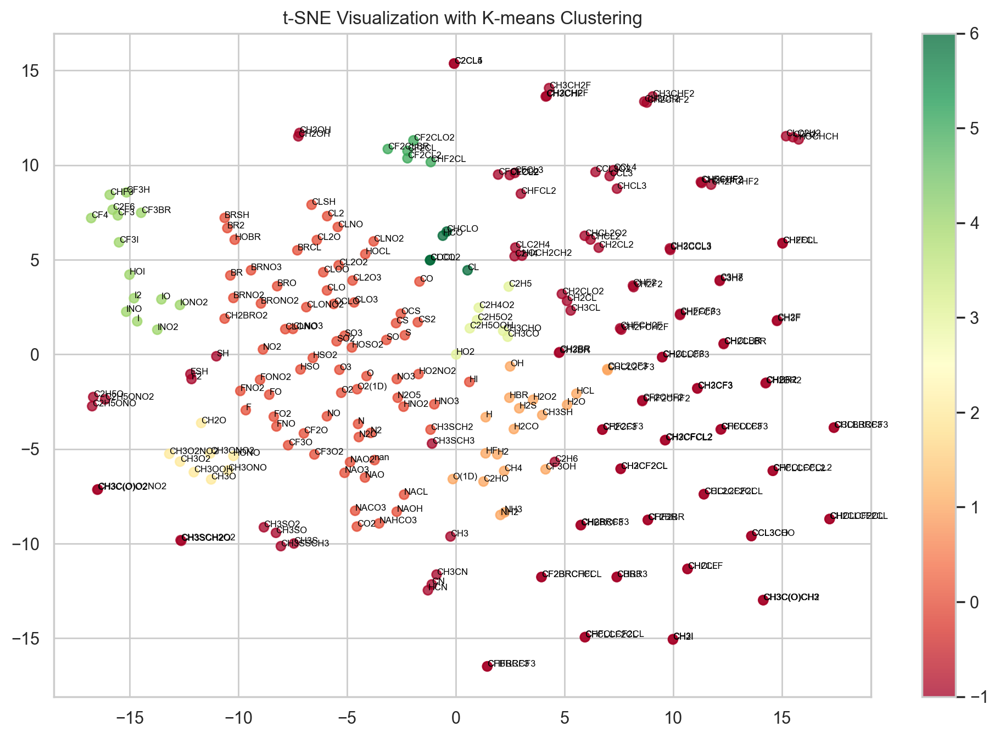

In [54]:
from node2vec import Node2Vec
from sklearn.manifold import TSNE
from sklearn.cluster import  DBSCAN

# Create a graph (you can replace this with your own graph)
G = modernEarthD99

node2vec = Node2Vec(G, dimensions=64,walk_length=30,num_walks=300, seed=100)

walks = node2vec.walks

model = node2vec.fit(window=10, min_count=1, batch_words=32)

embeddings = np.array([model.wv[str(node)] for node in G.nodes()])

tsne = TSNE( n_components=2,perplexity=np.round((len(G)*.2)),
               n_iter = 2000, learning_rate=len(G)/48, verbose=1)
embedding = tsne.fit_transform(embeddings)

# kmeans = KMeans()
# clusters = kmeans.fit_predict(embedding)
# c_labels = kmeans.labels_
c_labels = DBSCAN(eps =2 , min_samples = 5).fit_predict(embedding)

# Visualize the clusters on the t-SNE plot
plt.figure(figsize=(12, 8), dpi=200)
cmap = plt.cm.RdYlGn
scatter = plt.scatter(embedding[:, 0], embedding[:, 1], c=c_labels, cmap=cmap,alpha=0.75)
for i, label in enumerate(G.nodes()):
    plt.text(embedding[i, 0], embedding[i, 1], str(label), fontsize=6, color='black')

plt.colorbar(scatter)
plt.title('t-SNE Visualization with K-means Clustering')
plt.show()




<H1>node2vec cluster with DBSCAN</h1>

Computing transition probabilities:   0%|          | 0/56 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:02<00:00, 140.39it/s]


[t-SNE] Computing 34 nearest neighbors...
[t-SNE] Indexed 56 samples in 0.000s...
[t-SNE] Computed neighbors for 56 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 56 / 56
[t-SNE] Mean sigma: 0.415663
[t-SNE] KL divergence after 100 iterations with early exaggeration: 46.446590
[t-SNE] KL divergence after 1050 iterations: 0.364380


Computing transition probabilities:   0%|          | 0/61 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:02<00:00, 109.81it/s]


[t-SNE] Computing 37 nearest neighbors...
[t-SNE] Indexed 61 samples in 0.000s...
[t-SNE] Computed neighbors for 61 samples in 0.006s...
[t-SNE] Computed conditional probabilities for sample 61 / 61
[t-SNE] Mean sigma: 0.386561
[t-SNE] KL divergence after 250 iterations with early exaggeration: 45.478188
[t-SNE] KL divergence after 1100 iterations: 0.458788


Computing transition probabilities:   0%|          | 0/242 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:07<00:00, 39.22it/s]


[t-SNE] Computing 145 nearest neighbors...
[t-SNE] Indexed 242 samples in 0.001s...
[t-SNE] Computed neighbors for 242 samples in 0.006s...
[t-SNE] Computed conditional probabilities for sample 242 / 242
[t-SNE] Mean sigma: 1.003176
[t-SNE] KL divergence after 250 iterations with early exaggeration: 47.164356
[t-SNE] KL divergence after 1200 iterations: 0.493770


Computing transition probabilities:   0%|          | 0/89 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:03<00:00, 84.12it/s] 


[t-SNE] Computing 55 nearest neighbors...
[t-SNE] Indexed 89 samples in 0.000s...
[t-SNE] Computed neighbors for 89 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 89 / 89
[t-SNE] Mean sigma: 0.534664
[t-SNE] KL divergence after 250 iterations with early exaggeration: 45.432468
[t-SNE] KL divergence after 850 iterations: 0.493568


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:00<00:00, 357.80it/s]


[t-SNE] Computing 19 nearest neighbors...
[t-SNE] Indexed 28 samples in 0.000s...
[t-SNE] Computed neighbors for 28 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 28 / 28
[t-SNE] Mean sigma: 0.303808
[t-SNE] KL divergence after 100 iterations with early exaggeration: 45.609283
[t-SNE] KL divergence after 950 iterations: 0.307426


Computing transition probabilities:   0%|          | 0/124 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:03<00:00, 78.83it/s]


[t-SNE] Computing 76 nearest neighbors...
[t-SNE] Indexed 124 samples in 0.001s...
[t-SNE] Computed neighbors for 124 samples in 0.004s...
[t-SNE] Computed conditional probabilities for sample 124 / 124
[t-SNE] Mean sigma: 0.621850
[t-SNE] KL divergence after 250 iterations with early exaggeration: 45.766174
[t-SNE] KL divergence after 850 iterations: 0.382154


Computing transition probabilities:   0%|          | 0/82 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:02<00:00, 113.81it/s]


[t-SNE] Computing 49 nearest neighbors...
[t-SNE] Indexed 82 samples in 0.001s...
[t-SNE] Computed neighbors for 82 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 82 / 82
[t-SNE] Mean sigma: 0.414894
[t-SNE] KL divergence after 250 iterations with early exaggeration: 45.787678
[t-SNE] KL divergence after 950 iterations: 0.463584


Computing transition probabilities:   0%|          | 0/81 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:03<00:00, 89.05it/s] 


[t-SNE] Computing 49 nearest neighbors...
[t-SNE] Indexed 81 samples in 0.001s...
[t-SNE] Computed neighbors for 81 samples in 0.004s...
[t-SNE] Computed conditional probabilities for sample 81 / 81
[t-SNE] Mean sigma: 0.416190
[t-SNE] KL divergence after 250 iterations with early exaggeration: 45.442516
[t-SNE] KL divergence after 1100 iterations: 0.423253


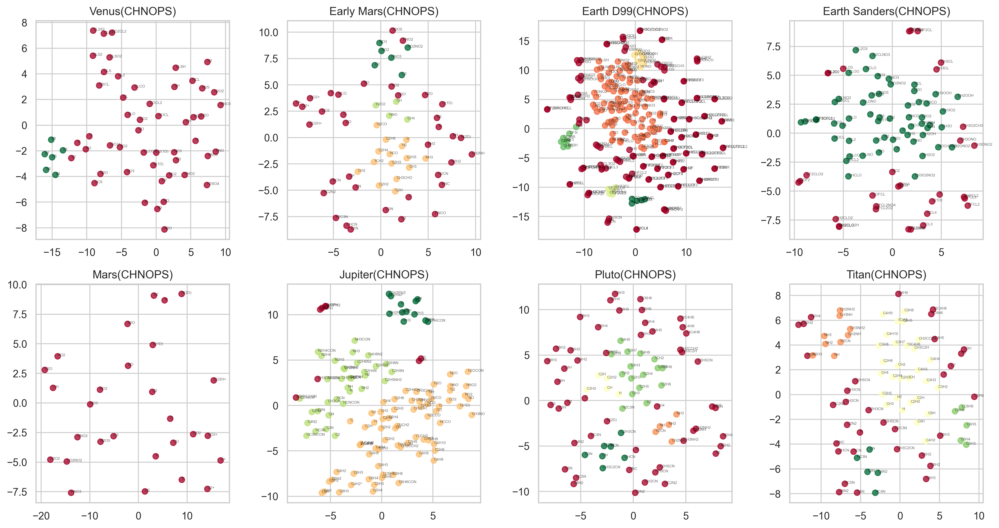

In [55]:
from node2vec import Node2Vec
from sklearn.manifold import TSNE
from sklearn.cluster import  DBSCAN

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(15, 8), dpi=300)
labels = ['Venus', 'Early Mars', 'Earth D99', 'Earth Sanders', 'Mars', 'Jupiter', 'Pluto', 'Titan']
for i, planet in enumerate(planets):
    G = extractChemistry(planet, ['C', 'H', 'N', 'O', 'P', 'S'])

    node2vec = Node2Vec(G, dimensions=64, walk_length=30, num_walks=300, seed=100)
    walks = node2vec.walks
    model = node2vec.fit(window=10, min_count=1, batch_words=32)
    embeddings = np.array([model.wv[str(node)] for node in G.nodes()])

    tsne = TSNE(n_components=2, perplexity=np.round((len(G) * 0.2)),
                n_iter=2000, learning_rate=len(G) / 12, verbose=1)
    embedding = tsne.fit_transform(embeddings)

    # kmeans = KMeans()
    # clusters = kmeans.fit_predict(embedding)
    # c_labels = kmeans.labels_
    c_labels = DBSCAN(eps=2, min_samples=5).fit_predict(embedding)

    # Determine subplot indices for the current planet
    row, col = divmod(i, 4)  # Use 4 for a 2x4 grid

    # Access the appropriate subplot
    ax = axes[row, col]

    cmap = plt.cm.RdYlGn
    ax.scatter(embedding[:, 0], embedding[:, 1], c=c_labels, cmap=cmap, alpha=0.75)
    ax.set_title(labels[i]+ "(CHNOPS)")
    for i, label in enumerate(G.nodes()):
        ax.text(embedding[i, 0], embedding[i, 1], str(label), fontsize=4, color='black', alpha=0.6)
    

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

<H1>node2vec cluster with K-Mean

Computing transition probabilities:   0%|          | 0/40 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:00<00:00, 329.06it/s]


[t-SNE] Computing 25 nearest neighbors...
[t-SNE] Indexed 40 samples in 0.001s...
[t-SNE] Computed neighbors for 40 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 40 / 40
[t-SNE] Mean sigma: 0.267960
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.449028
[t-SNE] KL divergence after 1000 iterations: 0.096641


Computing transition probabilities:   0%|          | 0/49 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:01<00:00, 184.56it/s]


[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 49 samples in 0.000s...
[t-SNE] Computed neighbors for 49 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 49 / 49
[t-SNE] Mean sigma: 0.259800
[t-SNE] KL divergence after 250 iterations with early exaggeration: 45.025581
[t-SNE] KL divergence after 1000 iterations: 0.086322


Computing transition probabilities:   0%|          | 0/31 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:00<00:00, 377.71it/s]


[t-SNE] Computing 19 nearest neighbors...
[t-SNE] Indexed 31 samples in 0.000s...
[t-SNE] Computed neighbors for 31 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 31 / 31
[t-SNE] Mean sigma: 0.125230
[t-SNE] KL divergence after 250 iterations with early exaggeration: 42.132214
[t-SNE] KL divergence after 1000 iterations: 0.243422


Computing transition probabilities:   0%|          | 0/41 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:01<00:00, 253.66it/s]


[t-SNE] Computing 25 nearest neighbors...
[t-SNE] Indexed 41 samples in 0.000s...
[t-SNE] Computed neighbors for 41 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 41 / 41
[t-SNE] Mean sigma: 0.162065
[t-SNE] KL divergence after 250 iterations with early exaggeration: 39.565247
[t-SNE] KL divergence after 1000 iterations: 0.092610


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:00<00:00, 601.69it/s]


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 24 samples in 0.000s...
[t-SNE] Computed neighbors for 24 samples in 0.004s...
[t-SNE] Computed conditional probabilities for sample 24 / 24
[t-SNE] Mean sigma: 0.203446
[t-SNE] KL divergence after 250 iterations with early exaggeration: 44.024055
[t-SNE] KL divergence after 1000 iterations: 0.094880


Computing transition probabilities:   0%|          | 0/101 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:03<00:00, 80.48it/s] 


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 101 samples in 0.000s...
[t-SNE] Computed neighbors for 101 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 101 / 101
[t-SNE] Mean sigma: 0.102201
[t-SNE] KL divergence after 250 iterations with early exaggeration: 46.342880
[t-SNE] KL divergence after 1000 iterations: 0.241469


Computing transition probabilities:   0%|          | 0/79 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:03<00:00, 82.67it/s] 


[t-SNE] Computing 49 nearest neighbors...
[t-SNE] Indexed 79 samples in 0.000s...
[t-SNE] Computed neighbors for 79 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 79 / 79
[t-SNE] Mean sigma: 0.174057
[t-SNE] KL divergence after 250 iterations with early exaggeration: 36.343155
[t-SNE] KL divergence after 1000 iterations: 0.123736


Computing transition probabilities:   0%|          | 0/78 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:03<00:00, 79.11it/s] 


[t-SNE] Computing 49 nearest neighbors...
[t-SNE] Indexed 78 samples in 0.000s...
[t-SNE] Computed neighbors for 78 samples in 0.011s...
[t-SNE] Computed conditional probabilities for sample 78 / 78
[t-SNE] Mean sigma: 0.167726
[t-SNE] KL divergence after 250 iterations with early exaggeration: 35.953941
[t-SNE] KL divergence after 1000 iterations: 0.113065


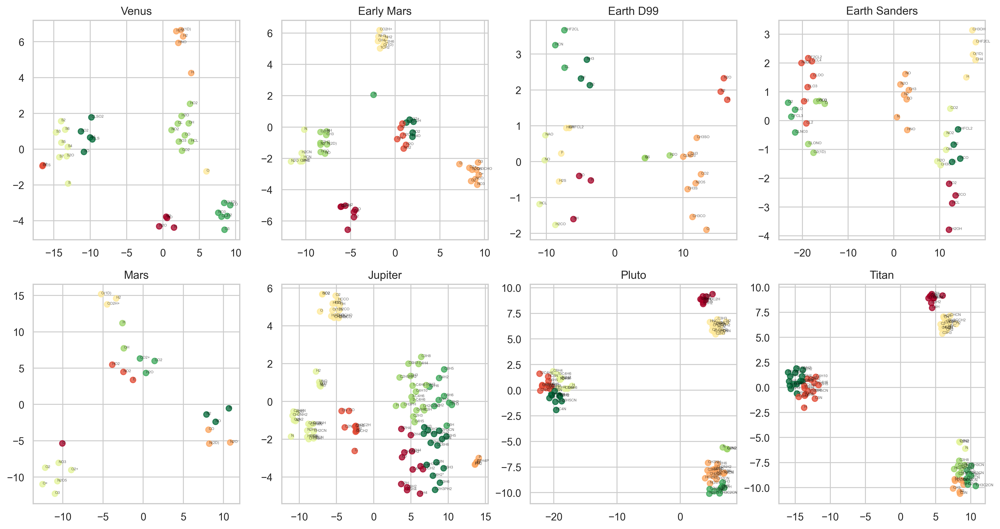

In [56]:
from node2vec import Node2Vec
from sklearn.manifold import TSNE
from sklearn.cluster import  DBSCAN

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(15, 8), dpi=300)
labels = ['Venus', 'Early Mars', 'Earth D99', 'Earth Sanders', 'Mars', 'Jupiter', 'Pluto', 'Titan']
for i, planet in enumerate(planets):
    G = getCHNOPS(planet, chnops=True)
    if G is None or len(G.nodes()) == 0:
        print(f"Skipping {labels[i]} due to invalid graph.")
        continue

    node2vec = Node2Vec(G,dimensions=10, walk_length=30, num_walks=300,seed=100)
    walks = node2vec.walks
    model = node2vec.fit(window=10, min_count=1, batch_words=32)
    embeddings = np.array([model.wv[str(node)] for node in G.nodes()])

    tsne = TSNE(n_components=2, perplexity=np.round((len(G) * 0.2)),
                n_iter=1000, learning_rate=len(G) / 12, verbose=1)
    embedding = tsne.fit_transform(embeddings)

    # kmeans = KMeans()
    clusters = kmeans.fit_predict(embedding)
    c_labels = kmeans.labels_
    
    # c_labels = DBSCAN(eps=0.2, min_samples=5).fit_predict(embedding)

    # Determine subplot indices for the current planet
    row, col = divmod(i, 4)  # Use 4 for a 2x4 grid

    # Access the appropriate subplot
    ax = axes[row, col]

    cmap = plt.cm.RdYlGn
    ax.scatter(embedding[:, 0], embedding[:, 1], c=c_labels, cmap=cmap, alpha=0.75)
    ax.set_title(labels[i])
    for i, label in enumerate(G.nodes()):
        ax.text(embedding[i, 0], embedding[i, 1], str(label), fontsize=4, color='black', alpha=0.6)
    

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

Computing transition probabilities:   0%|          | 0/56 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:01<00:00, 172.48it/s]


[t-SNE] Computing 34 nearest neighbors...
[t-SNE] Indexed 56 samples in 0.000s...
[t-SNE] Computed neighbors for 56 samples in 0.006s...
[t-SNE] Computed conditional probabilities for sample 56 / 56
[t-SNE] Mean sigma: 0.408147
[t-SNE] KL divergence after 250 iterations with early exaggeration: 46.396763
[t-SNE] KL divergence after 1300 iterations: 0.409304


Computing transition probabilities:   0%|          | 0/61 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:01<00:00, 158.30it/s]


[t-SNE] Computing 37 nearest neighbors...
[t-SNE] Indexed 61 samples in 0.001s...
[t-SNE] Computed neighbors for 61 samples in 0.004s...
[t-SNE] Computed conditional probabilities for sample 61 / 61
[t-SNE] Mean sigma: 0.389936
[t-SNE] KL divergence after 200 iterations with early exaggeration: 45.590813
[t-SNE] KL divergence after 1150 iterations: 0.461332


Computing transition probabilities:   0%|          | 0/243 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:06<00:00, 43.94it/s]


[t-SNE] Computing 148 nearest neighbors...
[t-SNE] Indexed 243 samples in 0.000s...
[t-SNE] Computed neighbors for 243 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 243 / 243
[t-SNE] Mean sigma: 0.995793
[t-SNE] KL divergence after 100 iterations with early exaggeration: 47.127342
[t-SNE] KL divergence after 2000 iterations: 0.472062


Computing transition probabilities:   0%|          | 0/89 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:02<00:00, 109.64it/s]


[t-SNE] Computing 55 nearest neighbors...
[t-SNE] Indexed 89 samples in 0.001s...
[t-SNE] Computed neighbors for 89 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 89 / 89
[t-SNE] Mean sigma: 0.537388
[t-SNE] KL divergence after 250 iterations with early exaggeration: 45.367371
[t-SNE] KL divergence after 900 iterations: 0.509356


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:00<00:00, 543.06it/s]


[t-SNE] Computing 19 nearest neighbors...
[t-SNE] Indexed 28 samples in 0.000s...
[t-SNE] Computed neighbors for 28 samples in 0.004s...
[t-SNE] Computed conditional probabilities for sample 28 / 28
[t-SNE] Mean sigma: 0.296613
[t-SNE] KL divergence after 100 iterations with early exaggeration: 45.096333
[t-SNE] KL divergence after 1350 iterations: 0.299183


Computing transition probabilities:   0%|          | 0/124 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:04<00:00, 67.32it/s]


[t-SNE] Computing 76 nearest neighbors...
[t-SNE] Indexed 124 samples in 0.000s...
[t-SNE] Computed neighbors for 124 samples in 0.031s...
[t-SNE] Computed conditional probabilities for sample 124 / 124
[t-SNE] Mean sigma: 0.626551
[t-SNE] KL divergence after 100 iterations with early exaggeration: 45.809944
[t-SNE] KL divergence after 1400 iterations: 0.355206


Computing transition probabilities:   0%|          | 0/82 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:04<00:00, 73.80it/s] 


[t-SNE] Computing 49 nearest neighbors...
[t-SNE] Indexed 82 samples in 0.000s...
[t-SNE] Computed neighbors for 82 samples in 0.004s...
[t-SNE] Computed conditional probabilities for sample 82 / 82
[t-SNE] Mean sigma: 0.414833
[t-SNE] KL divergence after 250 iterations with early exaggeration: 45.684635
[t-SNE] KL divergence after 1100 iterations: 0.490918


Computing transition probabilities:   0%|          | 0/81 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 300/300 [00:03<00:00, 82.46it/s] 


[t-SNE] Computing 49 nearest neighbors...
[t-SNE] Indexed 81 samples in 0.000s...
[t-SNE] Computed neighbors for 81 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 81 / 81
[t-SNE] Mean sigma: 0.428356
[t-SNE] KL divergence after 250 iterations with early exaggeration: 45.722939
[t-SNE] KL divergence after 1550 iterations: 0.429160


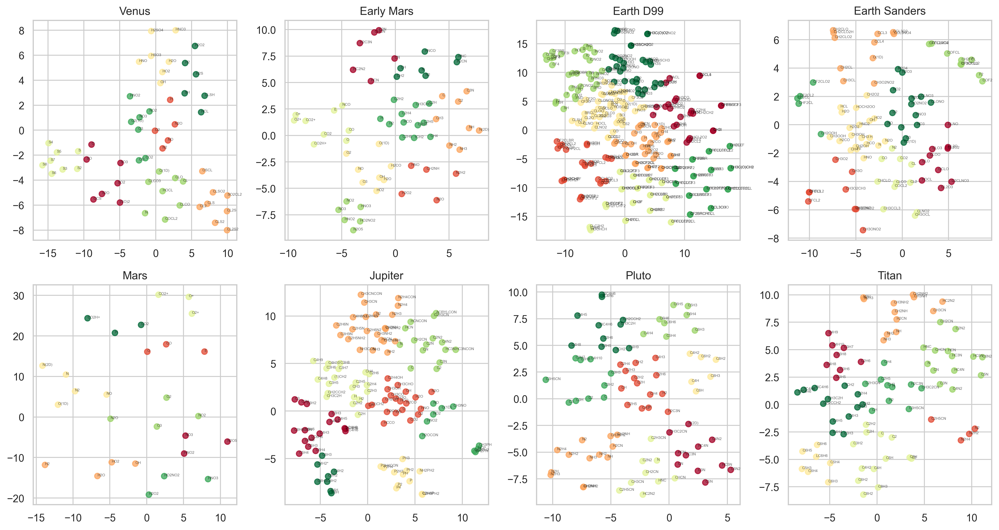

In [57]:
from node2vec import Node2Vec
from sklearn.manifold import TSNE
from sklearn.cluster import  DBSCAN

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(15, 8), dpi=300)
labels = ['Venus', 'Early Mars', 'Earth D99', 'Earth Sanders', 'Mars', 'Jupiter', 'Pluto', 'Titan']
for i, planet in enumerate(planets):
    G = planet#extractChemistry(planet, ['C', 'H', 'N', 'O', 'P', 'S'])

    node2vec = Node2Vec(G, dimensions=64, walk_length=30, num_walks=300, seed=100)
    walks = node2vec.walks
    model = node2vec.fit(window=10, min_count=1, batch_words=32)
    embeddings = np.array([model.wv[str(node)] for node in G.nodes()])

    tsne = TSNE(n_components=2, perplexity=np.round((len(G) * 0.2)),
                n_iter=2000, learning_rate=len(G) / 12, verbose=1)
    embedding = tsne.fit_transform(embeddings)

    kmeans = KMeans()
    clusters = kmeans.fit_predict(embedding)
    c_labels = kmeans.labels_
    # c_labels = DBSCAN(eps=2, min_samples=5).fit_predict(embedding)

    # Determine subplot indices for the current planet
    row, col = divmod(i, 4)  # Use 4 for a 2x4 grid

    # Access the appropriate subplot
    ax = axes[row, col]

    cmap = plt.cm.RdYlGn
    ax.scatter(embedding[:, 0], embedding[:, 1], c=c_labels, cmap=cmap, alpha=0.75)
    ax.set_title(labels[i])
    for i, label in enumerate(G.nodes()):
        ax.text(embedding[i, 0], embedding[i, 1], str(label), fontsize=4, color='black', alpha=0.6)
    

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

</h1>